In [12]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
import os
from PIL import Image
from skimage.segmentation import slic, mark_boundaries
from skimage.filters import threshold_otsu
from scipy.ndimage import gaussian_filter
from datetime import datetime
import os

In [13]:
print("Current Working Directory:", os.getcwd())

Current Working Directory: /Users/kevin/Downloads/Northwestern University/Data Science/STAT_390


In [14]:
# TO DO: Needs to be changed to the correct working directory

os.chdir("/Users/kevin/Downloads/Northwestern University/Data Science/STAT_390")
print("New Working Directory:", os.getcwd())

New Working Directory: /Users/kevin/Downloads/Northwestern University/Data Science/STAT_390


### Week 4 Progress

In [19]:
# Generate Contour-Based Epithelium Mask. Credit: Team 2

def generate_epithelium_mask(image_path):
    
    image = cv2.imread(image_path)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred_image = cv2.GaussianBlur(gray_image, (45, 45), 0)
    _, thresholded_mask = cv2.threshold(blurred_image, 200, 255, cv2.THRESH_BINARY_INV)
    kernel_huge = np.ones((45, 45), np.uint8)
    cleaned_mask = cv2.morphologyEx(thresholded_mask, cv2.MORPH_CLOSE, kernel_huge)
    cleaned_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_OPEN, kernel_huge)

    kernel_medium = np.ones((25, 25), np.uint8)
    generalized_cleaned_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_CLOSE, kernel_medium)
    generalized_cleaned_mask = cv2.morphologyEx(generalized_cleaned_mask, cv2.MORPH_OPEN, kernel_medium)

    # Find contours for the generalized mask
    contours, _ = cv2.findContours(generalized_cleaned_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Draw contours on a separate mask
    contour_mask = np.zeros_like(generalized_cleaned_mask)
    cv2.drawContours(contour_mask, contours, -1, 255, thickness=cv2.FILLED)
    
    return contour_mask, contours, image

In [20]:
# Creating Superpixels and Cutting Along Contour Boundaries

def create_and_cut_superpixels(image, contour_mask, contours, num_segments=750):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    segments = slic(image_rgb, n_segments=num_segments, compactness=10, start_label=1)
    
    segmented_image = np.zeros_like(image_rgb)
    lower_purple = np.array([125, 40, 40])
    upper_purple = np.array([155, 255, 255])

    for segment_value in np.unique(segments):
        segment_mask = (segments == segment_value)
        
        # Separate parts inside and outside the contour using the contour mask
        inside_mask = np.logical_and(segment_mask, contour_mask > 0)
        outside_mask = np.logical_and(segment_mask, contour_mask == 0)

        # Process inside region
        if np.sum(inside_mask) > 0:
            inside_segment = np.zeros_like(image_rgb)
            inside_segment[inside_mask] = image_rgb[inside_mask]
            inside_hsv = cv2.cvtColor(inside_segment, cv2.COLOR_RGB2HSV)
            purple_inside_mask = cv2.inRange(inside_hsv, lower_purple, upper_purple)
            
            # Calculate purple concentration inside
            total_pixels_inside = np.sum(inside_segment[:, :, 0] > 0)
            purple_pixels_inside = np.sum(purple_inside_mask > 0)
            purple_concentration_inside = purple_pixels_inside / total_pixels_inside if total_pixels_inside > 0 else 0

            # Assign colors based on purple concentration for inside
            if purple_concentration_inside > 0.15:
                segmented_image[inside_mask] = image_rgb[inside_mask]
            elif purple_concentration_inside > 0.015:
                segmented_image[inside_mask] = [255, 255, 255]
            else:
                segmented_image[inside_mask] = [0, 0, 0]

        # Process outside region (background)
        if np.sum(outside_mask) > 0:
            segmented_image[outside_mask] = [0, 0, 0]  # Assign black to outside background

    plt.figure(figsize=(10, 10))
    plt.imshow(segmented_image)
    plt.title("Final Segmented Epithelium Image with Contour-Based Cuts")
    plt.axis('off')
    plt.show()
    
    return segmented_image

In [21]:
# Combining both steps
def extract_epithelium(image_path):
    contour_mask, contours, original_image = generate_epithelium_mask(image_path)
    segmented_image = create_and_cut_superpixels(original_image, contour_mask, contours)
    cv2.imwrite('ExtractedEpithelium.tif', cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR))

In [ ]:
def extract_epithelium(image_path):
    # Generate contour mask and get original image
    contour_mask, contours, original_image = generate_epithelium_mask(image_path)
    
    # Create and cut superpixels
    segmented_image = create_and_cut_superpixels(original_image, contour_mask, contours)
    
    # Extract the base filename (without the extension) from the image path
    base_filename = os.path.basename(image_path)
    base_filename_no_ext = os.path.splitext(base_filename)[0]
    
    # Create the directory for saving the extracted images if it doesn't exist
    os.makedirs('Extracted Epithelium', exist_ok=True)
    
    # Save the segmented image using the modified name
    save_path = os.path.join('Extracted Epithelium', f"Epithelium: {base_filename_no_ext}.tif")
    cv2.imwrite(save_path, cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR))
    print(f"Saved segmented image as: {save_path}")

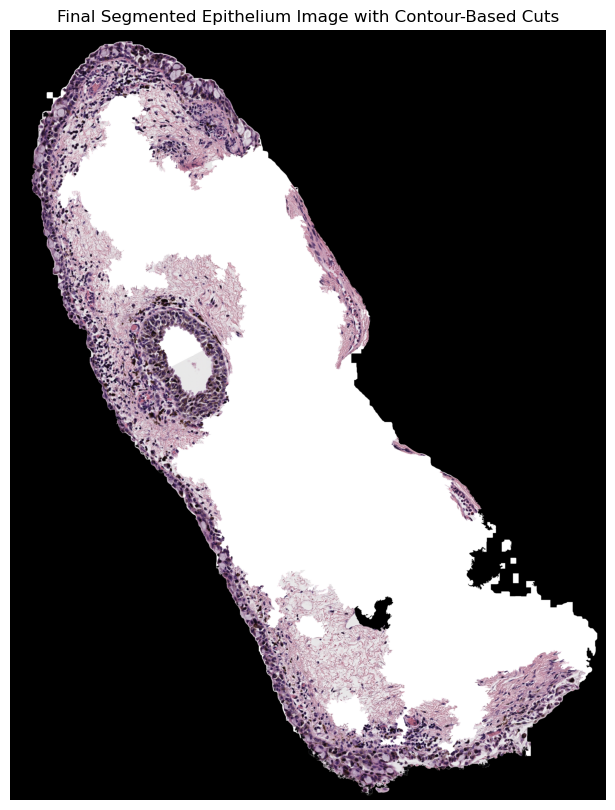

In [23]:
#extract_epithelium('Extracted Slices/h1810898A  h&e_ROI_1.tif')
extract_epithelium('HighQualitySample2.tif')

# <font color = 'purple'>Strategy 2: Histogram Color-Matching</font>

In [129]:
# Generate Contour-Based Epithelium Mask. Credit: Team 2

def generate_epithelium_mask(image_path):
    # Load the original image
    image = cv2.imread(image_path)
    
    # Step 1a: Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Step 1b: Apply Gaussian blur to smooth the image
    blurred_image = cv2.GaussianBlur(gray_image, (45, 45), 0)
    
    # Step 1c: Threshold the image to create an inverted binary mask
    _, thresholded_mask = cv2.threshold(blurred_image, 200, 255, cv2.THRESH_BINARY_INV)
    
    # Step 1d: Use morphological operations to clean up the mask (large kernel)
    kernel_huge = np.ones((45, 45), np.uint8)
    cleaned_mask = cv2.morphologyEx(thresholded_mask, cv2.MORPH_CLOSE, kernel_huge)
    cleaned_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_OPEN, kernel_huge)
    
    # Step 1e: Apply additional morphological operations with a medium kernel
    kernel_medium = np.ones((25, 25), np.uint8)
    generalized_cleaned_mask = cv2.morphologyEx(cleaned_mask, cv2.MORPH_CLOSE, kernel_medium)
    generalized_cleaned_mask = cv2.morphologyEx(generalized_cleaned_mask, cv2.MORPH_OPEN, kernel_medium)
    
    # Step 1f: Find contours and create a contour mask
    contours, _ = cv2.findContours(generalized_cleaned_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_mask = np.zeros_like(generalized_cleaned_mask)
    cv2.drawContours(contour_mask, contours, -1, 255, thickness=cv2.FILLED)
    
    return contour_mask, contours, image, gray_image

In [130]:
# Generate Histogram from Darkest Regions

##### IMPORTANT PARAMETER: percentage_threshold (0.1 works "better" with "light pink" tissue slices)

def generate_dark_region_histogram(image_rgb, gray_image, percentage_threshold=0.25):
    threshold_value = np.percentile(gray_image, 100 * percentage_threshold)
    dark_region_mask = cv2.inRange(gray_image, 0, threshold_value)
    dark_region = cv2.bitwise_and(image_rgb, image_rgb, mask=dark_region_mask)
    dark_histogram, _ = np.histogram(dark_region[dark_region_mask > 0], bins=256, range=(0, 256))
    
    # Normalize histogram for consistent scaling
    dark_histogram = dark_histogram.astype('float32') / np.sum(dark_histogram)
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(dark_region_mask, cmap='gray')
    plt.title("Dark Region Mask")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(dark_region)
    plt.title("Extracted Dark Regions (Epithelium?)")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.plot(dark_histogram)
    plt.title("Normalized Histogram of Dark Regions")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()
    
    return dark_histogram

In [135]:
# Classify Each Superpixel Using Histogram Matching

def create_and_cut_superpixels(image, contour_mask, contours, gray_image, num_segments=750):
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    segments = slic(image_rgb, n_segments=num_segments, compactness=10, start_label=1)
    segmented_image = np.zeros_like(image_rgb)
    
    # Generate reference histogram
    ref_histogram = generate_dark_region_histogram(image_rgb, gray_image).astype(np.float32)

    # Display the reference histogram for reference
    plt.figure(figsize=(5, 4))
    plt.plot(ref_histogram)
    plt.title("Reference Histogram of Dark Regions (Epithelium)")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.show()
    
    # Visualize superpixels and contour boundary before entering the for loop
    boundary_overlay = mark_boundaries(image_rgb, segments, color=(1, 0, 0), mode='thick')
    cv2.drawContours(boundary_overlay, contours, -1, (255, 0, 0), 4)

    plt.figure(figsize=(10, 10))
    plt.imshow(boundary_overlay)
    plt.title("Superpixels and Contour Boundary (Pre-Processing)")
    plt.axis('off')
    plt.show()
    
    
    segment_number = 0
    for segment_value in np.unique(segments):
        segment_number += 1
        segment_mask = (segments == segment_value)
        inside_mask = np.logical_and(segment_mask, contour_mask > 0)
        outside_mask = np.logical_and(segment_mask, contour_mask == 0)

        if np.sum(inside_mask) > 0:
            # Extract the RGB values of the entire superpixel region
            segment_rgb = image_rgb[inside_mask]
            
            # Calculate the RGB histogram of the entire superpixel
            current_histogram, _ = np.histogram(
                segment_rgb, bins=256, range=(0, 256)
            )
            current_histogram = current_histogram.astype(np.float32)
            
            # Normalize histogram
            current_histogram /= current_histogram.sum()

            # Compare the superpixel histogram to the reference histogram
            similarity = cv2.compareHist(ref_histogram, current_histogram, cv2.HISTCMP_CORREL)
            
            '''
            if segment_number % 25 == 0:
                
                # Print similarity for each superpixel
                print(f"Segment {segment_value}: Similarity Score = {similarity:.2f}")

                # Visualization for each segment
                plt.figure(figsize=(8, 4))
                plt.subplot(1, 2, 1)
                plt.imshow(image_rgb * (segments == segment_value)[:, :, None])
                plt.title("Entire Superpixel (RGB)")
                plt.axis('off')

                plt.subplot(1, 2, 2)
                plt.plot(current_histogram)
                plt.title("Current Superpixel Histogram (RGB)")
                plt.xlabel("Pixel Intensity")
                plt.ylabel("Frequency")
                plt.tight_layout()
                plt.show()
            '''
                
            # Classify superpixels based on similarity to reference histogram
            
            ##### IMPORTANT THRESHOLD: similarity (0.15 works "better" for light pink tissue slices; also tried 0.1, 0.075)
            
            if similarity > 0.2:
                segmented_image[inside_mask] = image_rgb[inside_mask]
            elif abs(similarity) > 0.01:
                segmented_image[inside_mask] = [255, 255, 255]
            else:
                segmented_image[inside_mask] = [0, 0, 0]

        if np.sum(outside_mask) > 0:
            segmented_image[outside_mask] = [0, 0, 0]  # Set background to black

            
    # Display final segmented image
    plt.figure(figsize=(10, 10))
    plt.imshow(segmented_image)
    plt.title("Final Segmented Epithelium Image")
    plt.axis('off')
    plt.show()
    
    return segmented_image

In [136]:
# Combine both steps

def extract_epithelium(image_path):
    contour_mask, contours, original_image, gray_image = generate_epithelium_mask(image_path)
    segmented_image = create_and_cut_superpixels(original_image, contour_mask, contours, gray_image)
    
    os.makedirs("Extracted Epithelium", exist_ok=True)
    name = os.path.basename(image_path).split('.')[0]
    save_path = f"Extracted Epithelium/Epithelium: {name}.tif"
    cv2.imwrite(save_path, cv2.cvtColor(segmented_image, cv2.COLOR_RGB2BGR))

## Testing

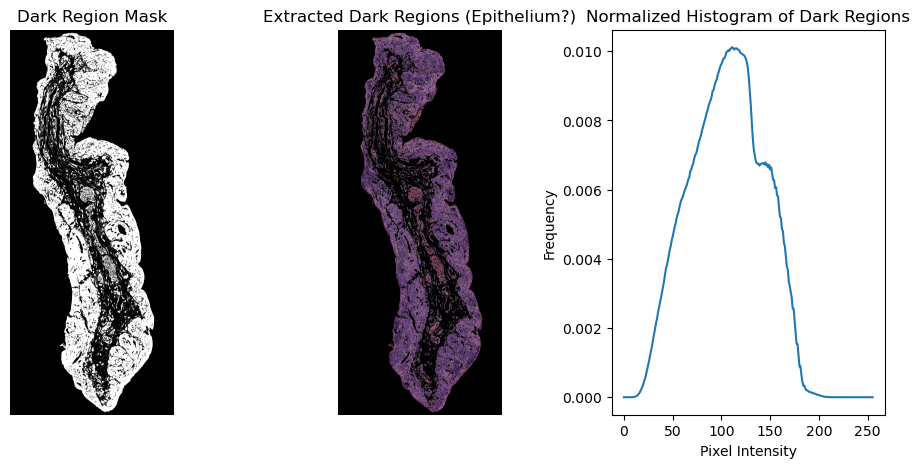

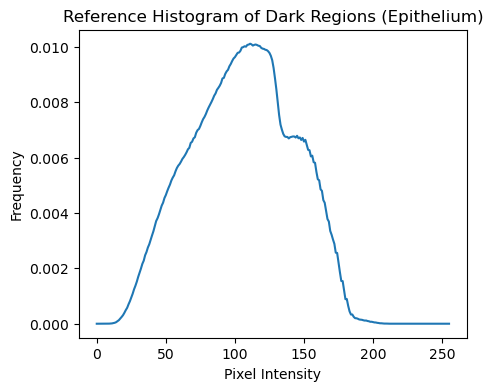

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


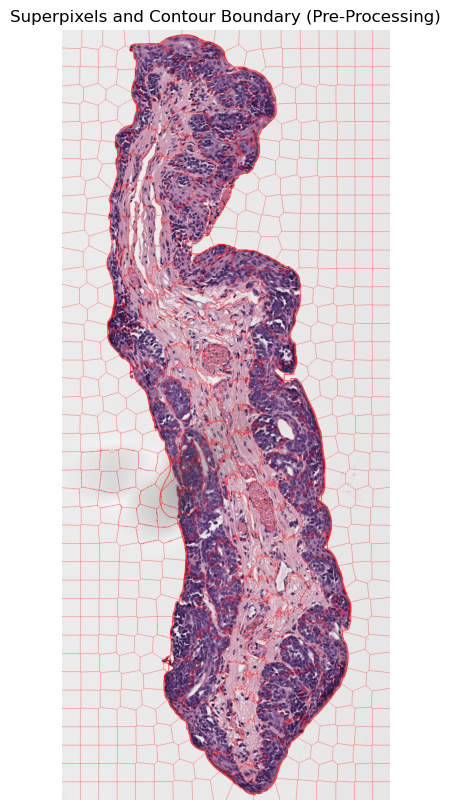

Segment 100: Similarity Score = 0.08


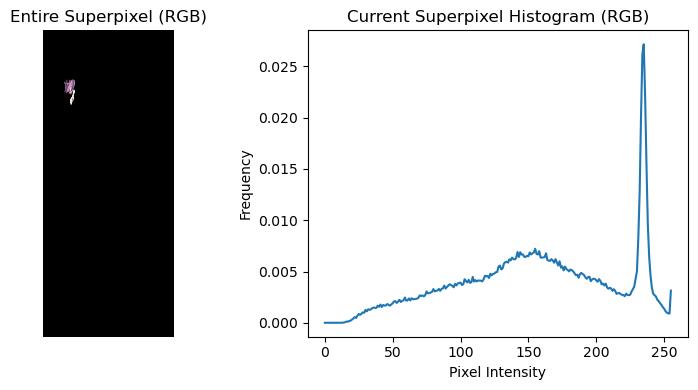

Segment 125: Similarity Score = -0.49


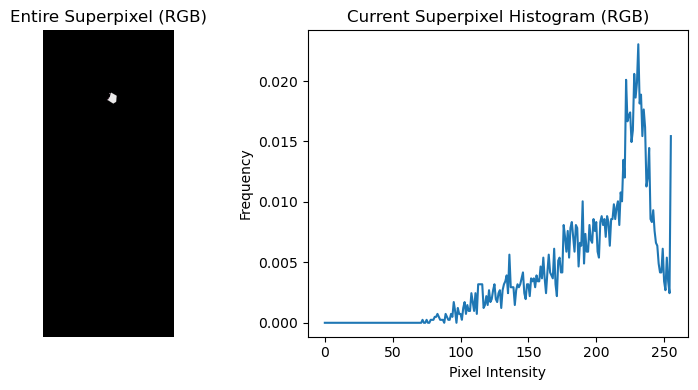

Segment 150: Similarity Score = 0.14


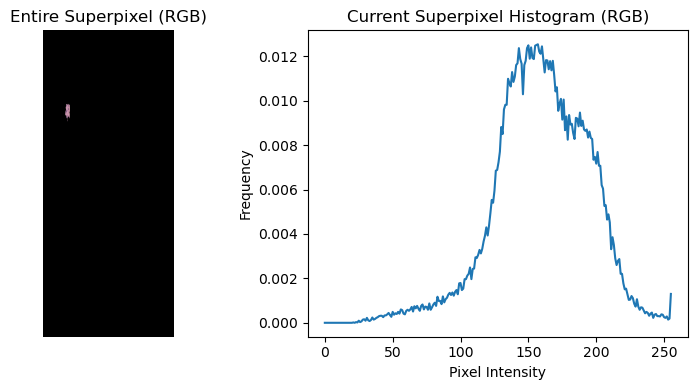

Segment 175: Similarity Score = 0.91


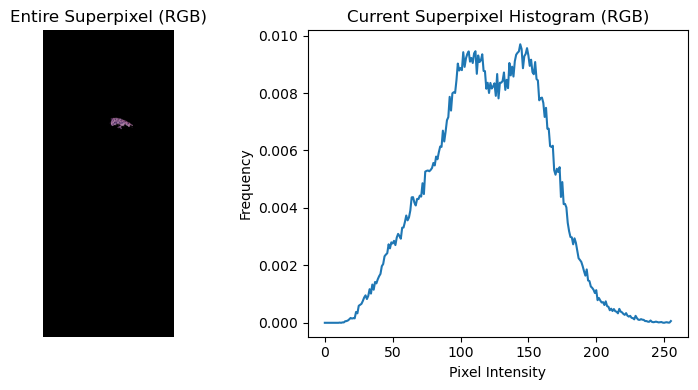

Segment 200: Similarity Score = 0.51


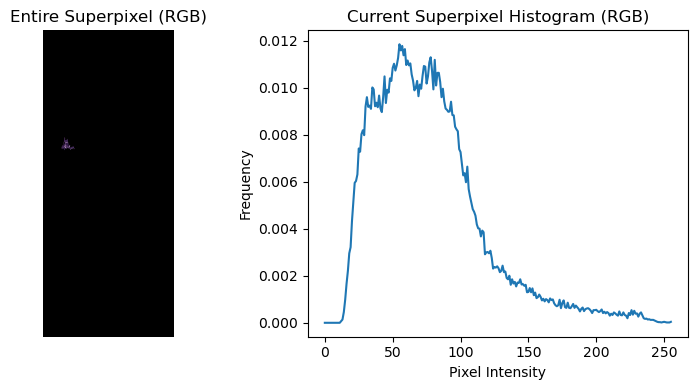

Segment 250: Similarity Score = -0.06


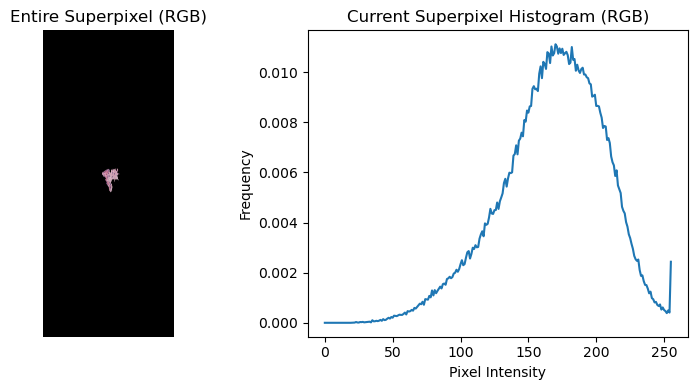

Segment 450: Similarity Score = -0.47


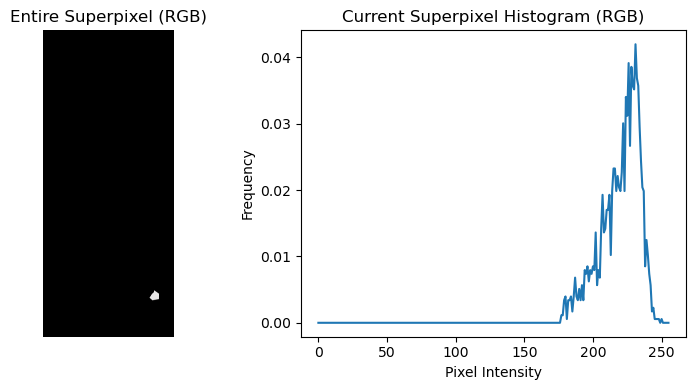

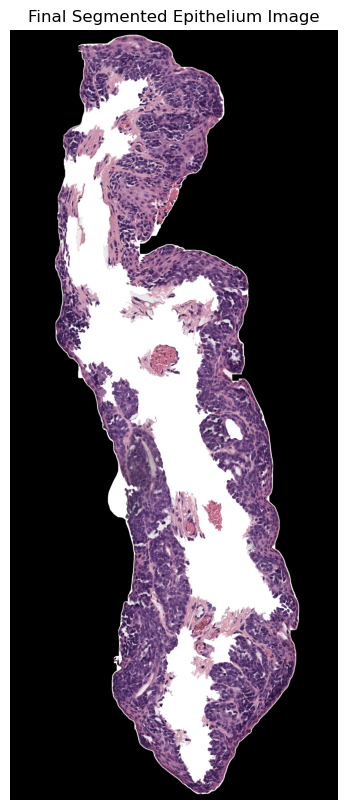

In [133]:
extract_epithelium('Tissue Slices/H&E/image2.tif')

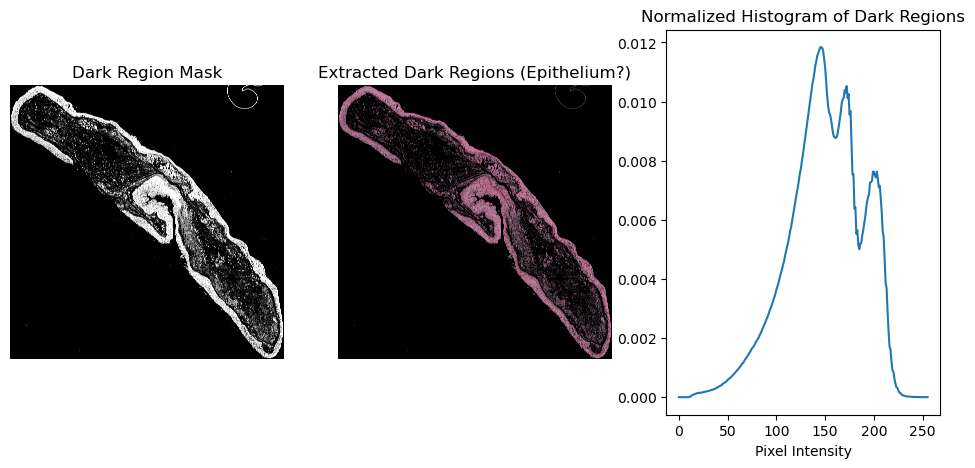

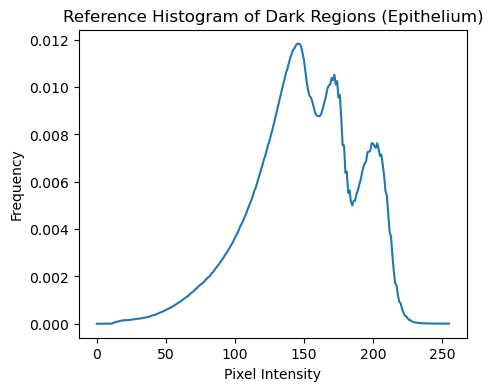

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


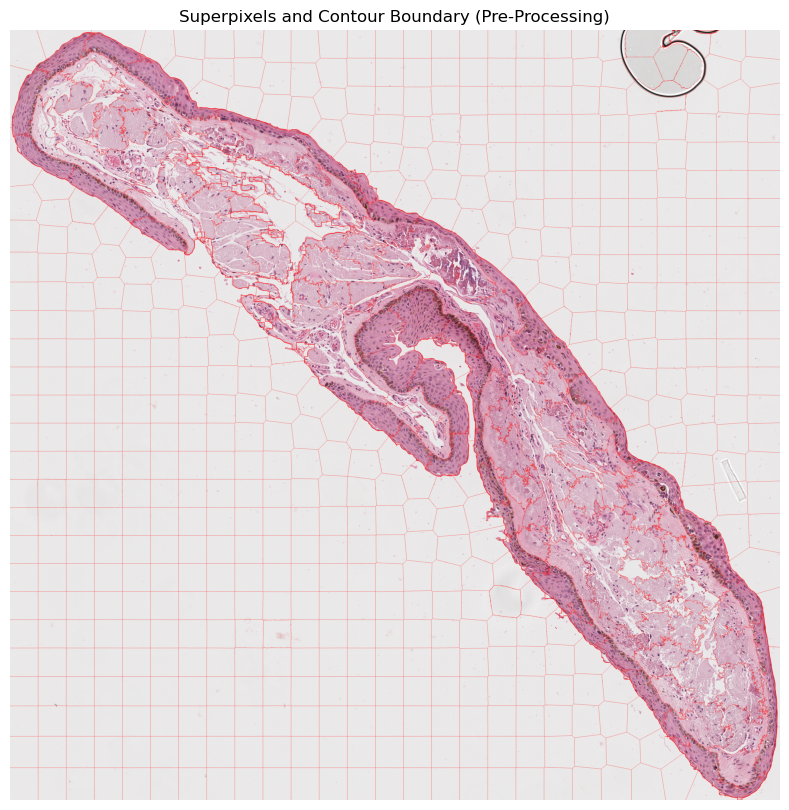

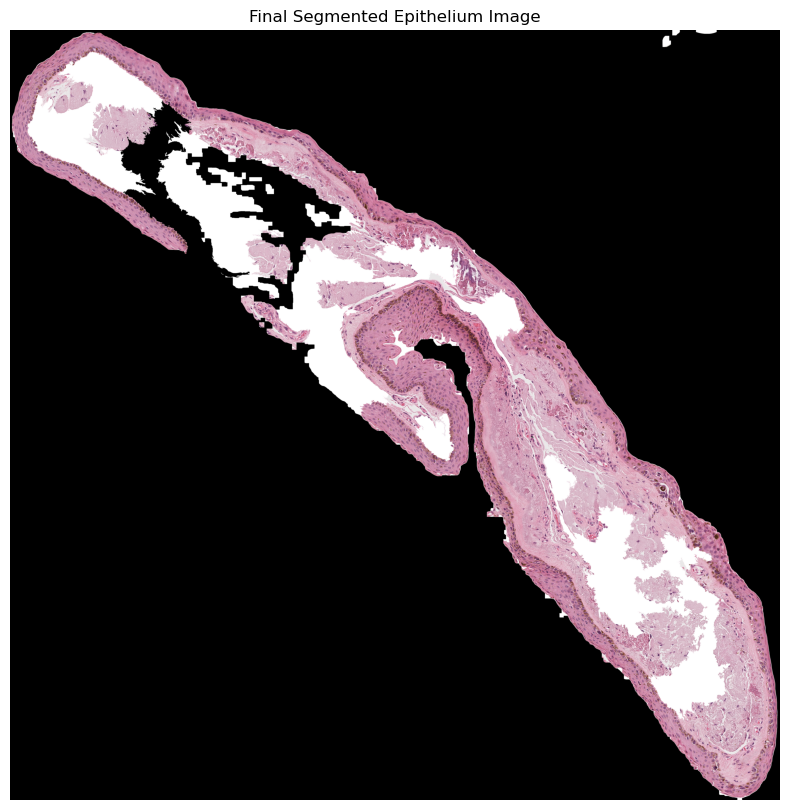

In [115]:
# percentage_threshold = 0.15
# similarity > 0.15
extract_epithelium('Tissue Slices/H&E/h1810898A  h&e_ROI_1.tif')

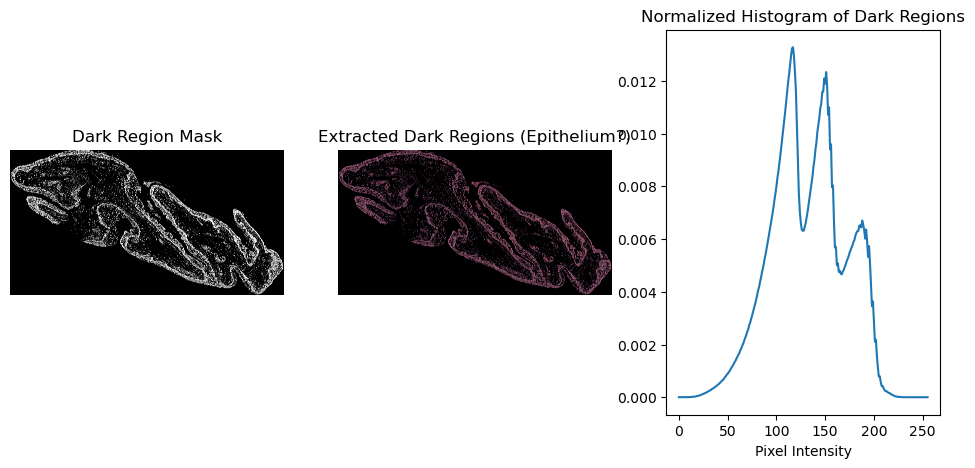

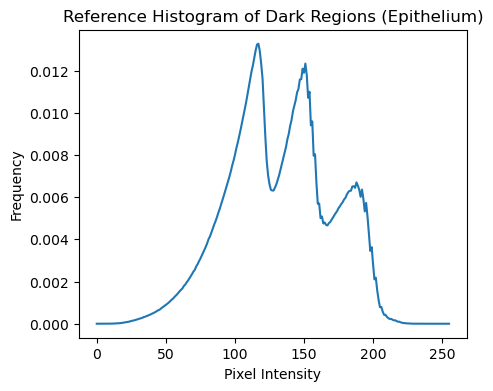

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


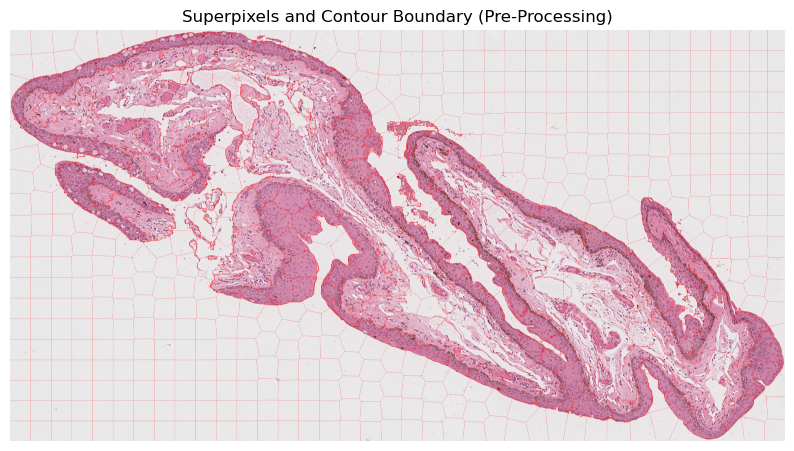

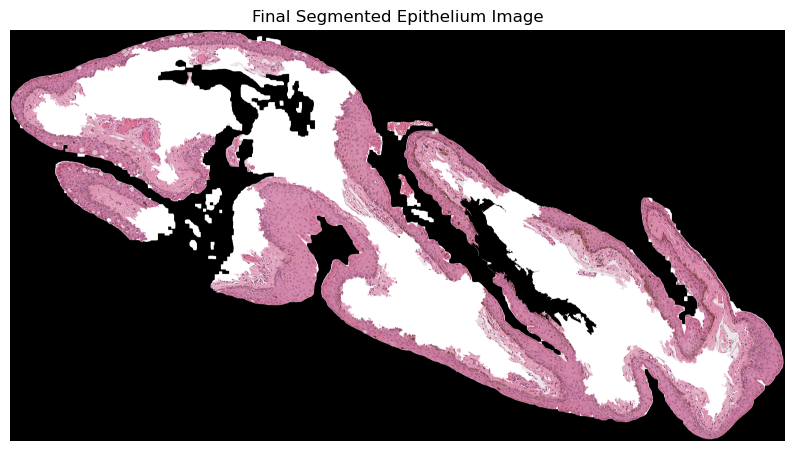

In [117]:
# Same parameters as above
extract_epithelium('Tissue Slices/H&E/h1812404B  h&e_ROI_3.tif')

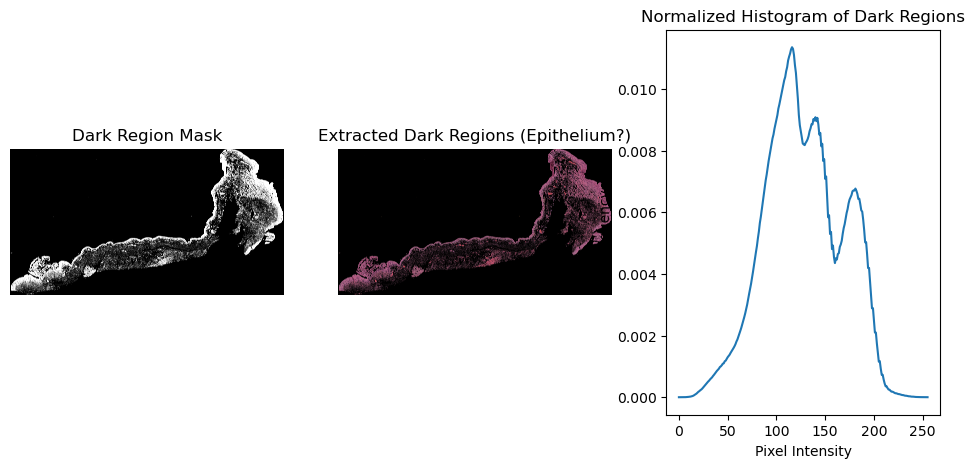

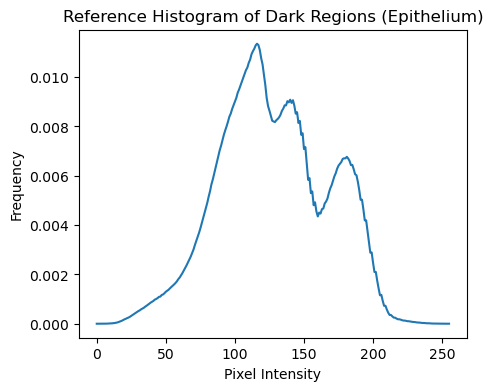

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


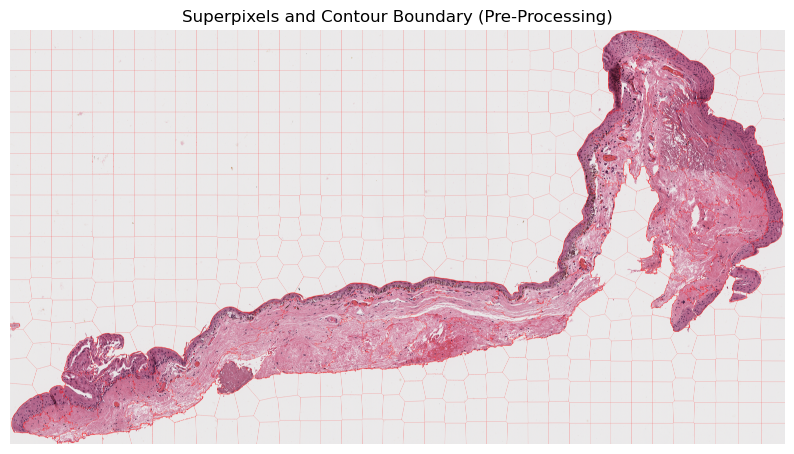

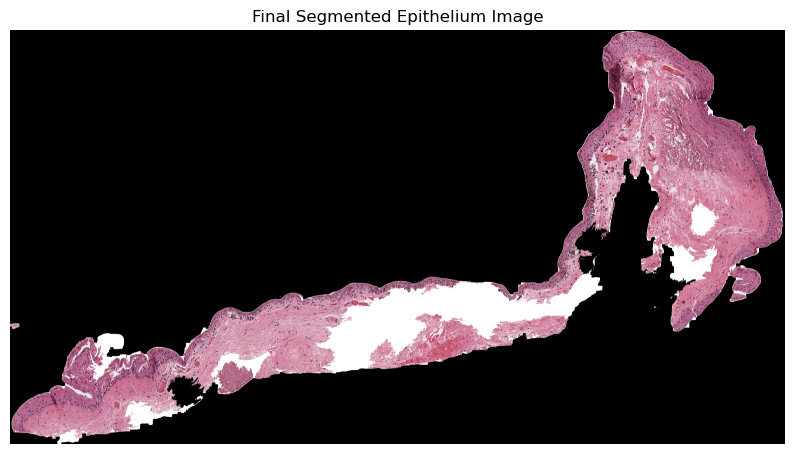

In [118]:
extract_epithelium('Tissue Slices/H&E/h1815449  h&e_ROI_2.tif')

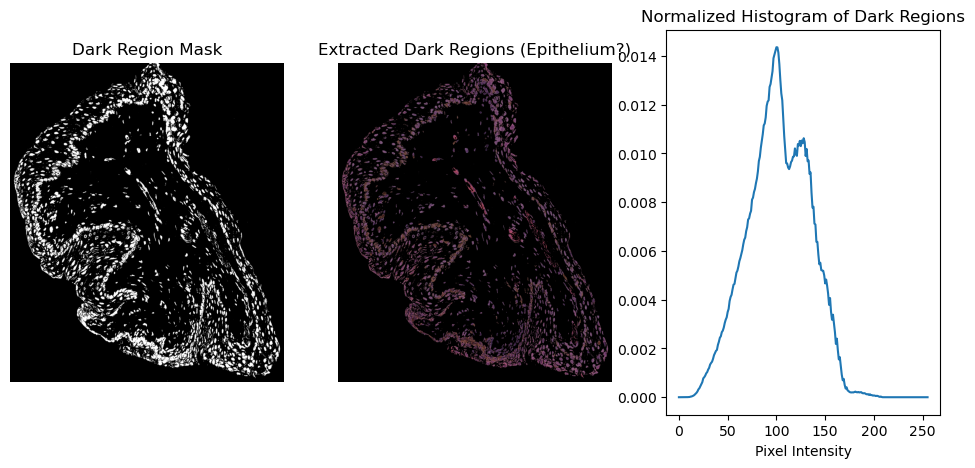

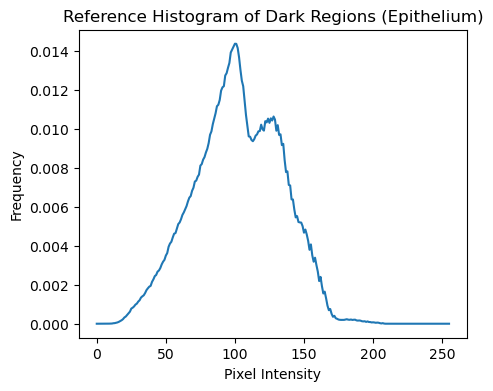

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


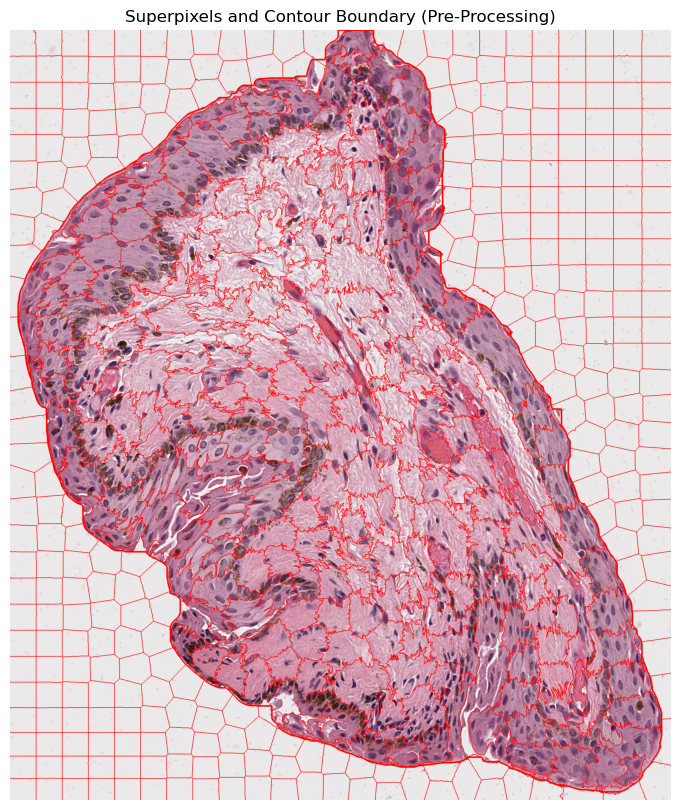

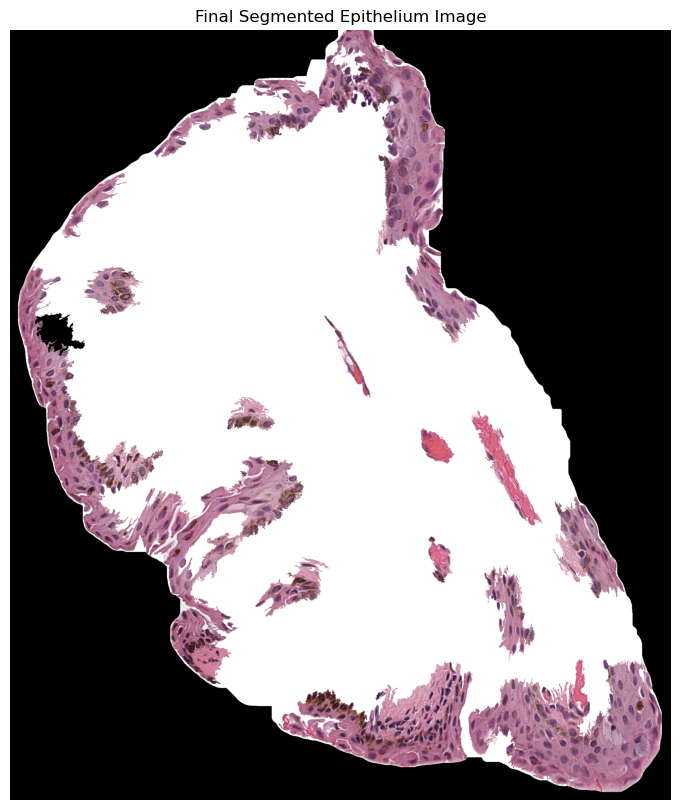

In [121]:
extract_epithelium('Tissue Slices/H&E/h1817608C  h&e_ROI_1.tif')

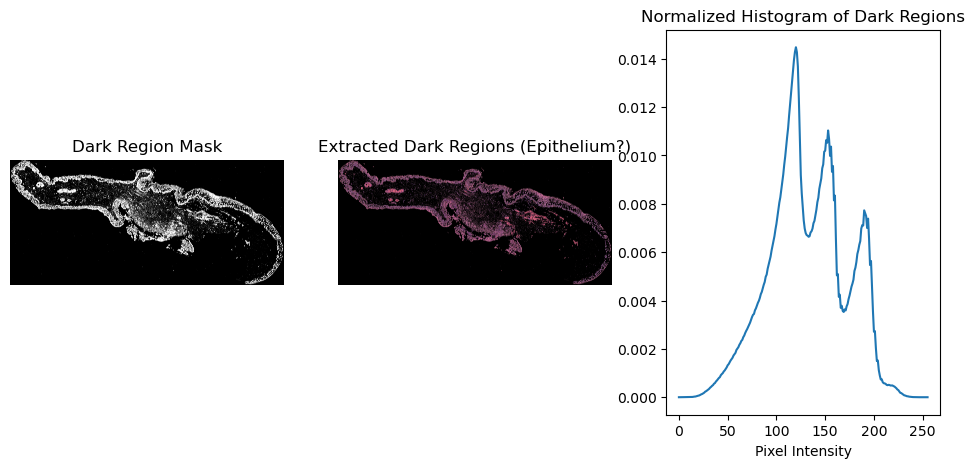

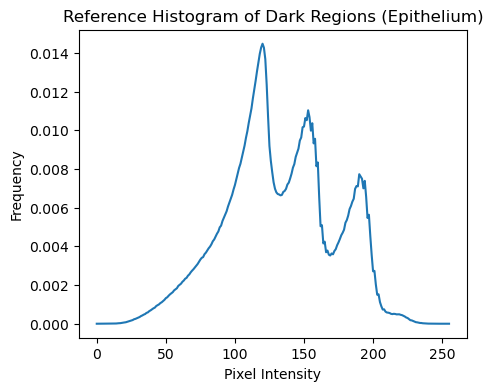

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


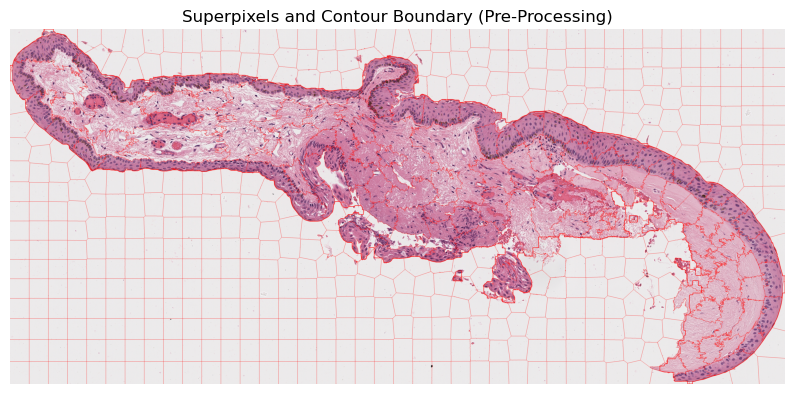

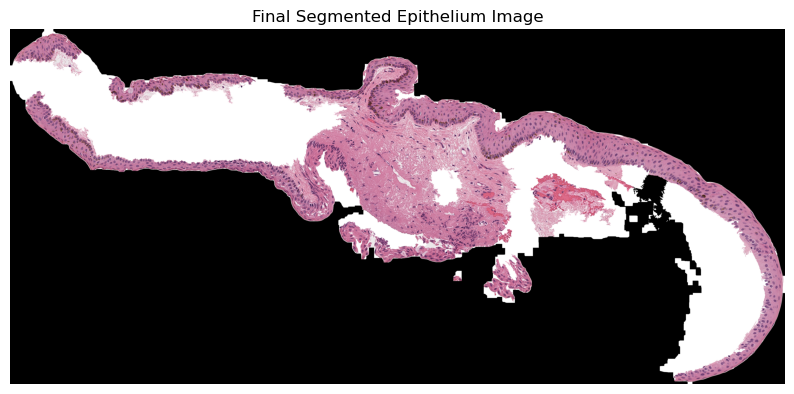

In [122]:
extract_epithelium('Tissue Slices/H&E/h1825421  h&e_ROI_3.tif')

## Testing on Melan-A

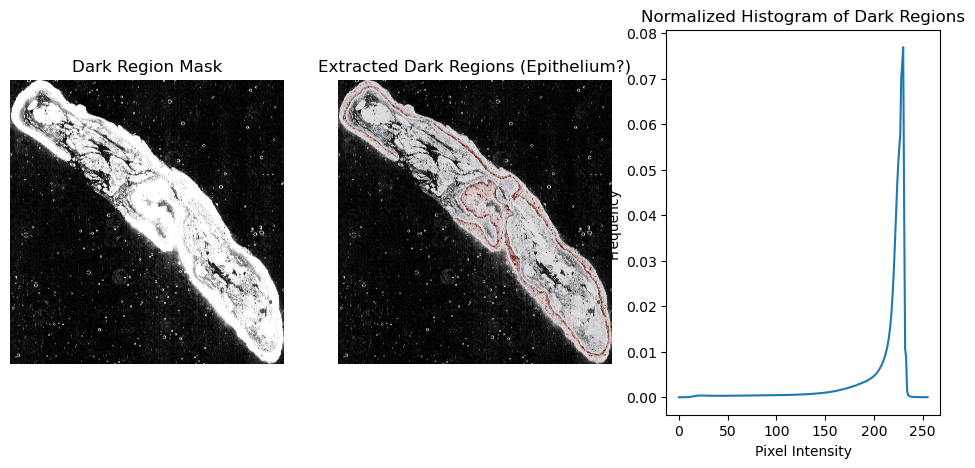

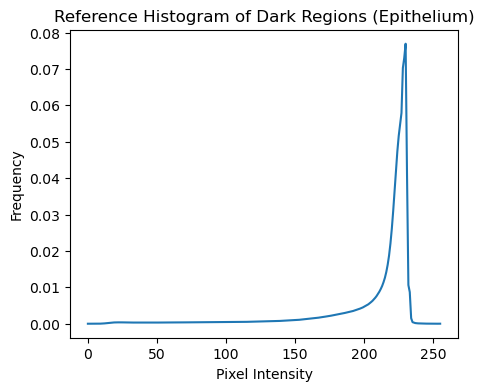

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


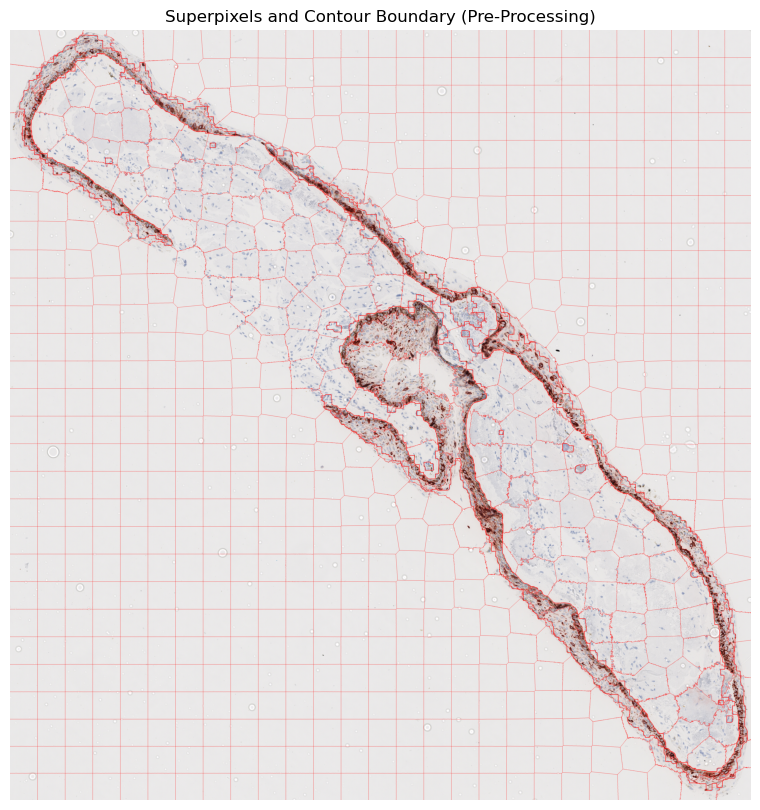

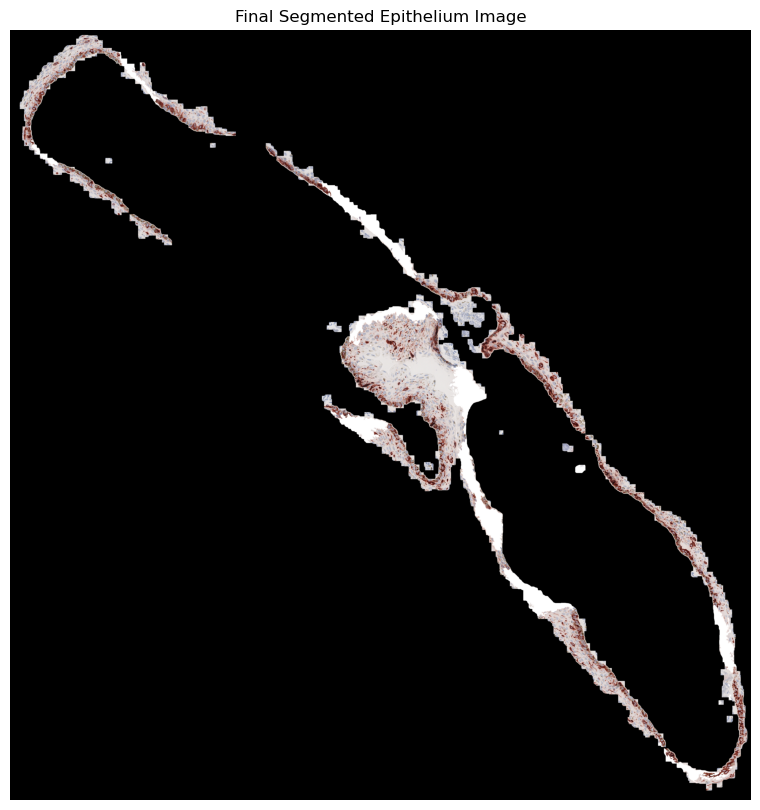

In [137]:
extract_epithelium('Tissue Slices/Melan-A/h1810898A mela_ROI_1.tif')

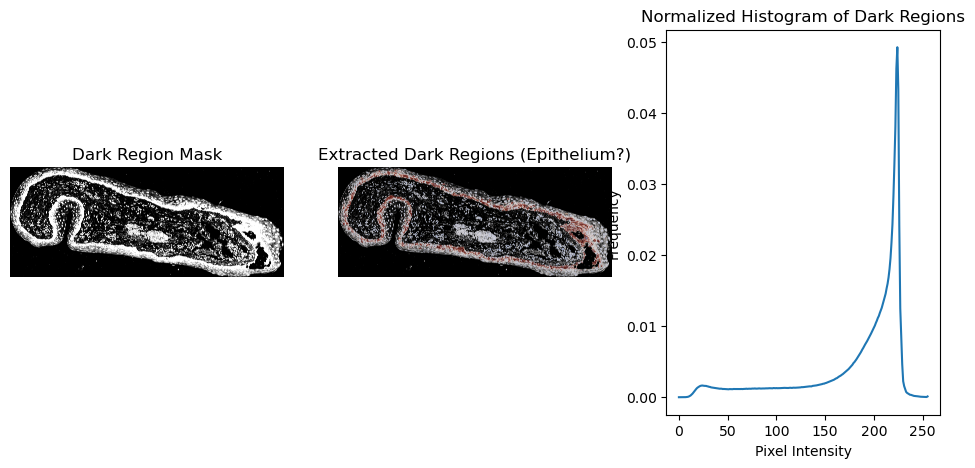

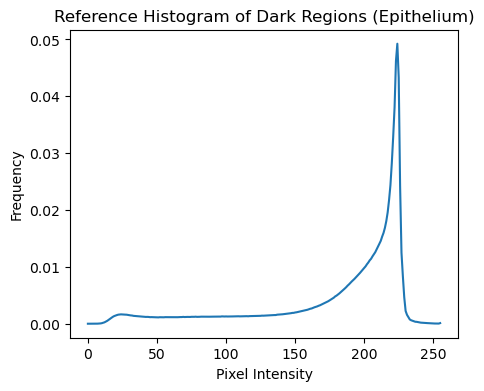

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


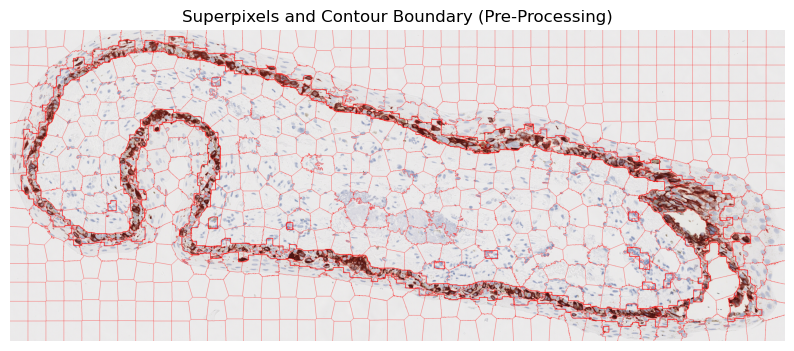

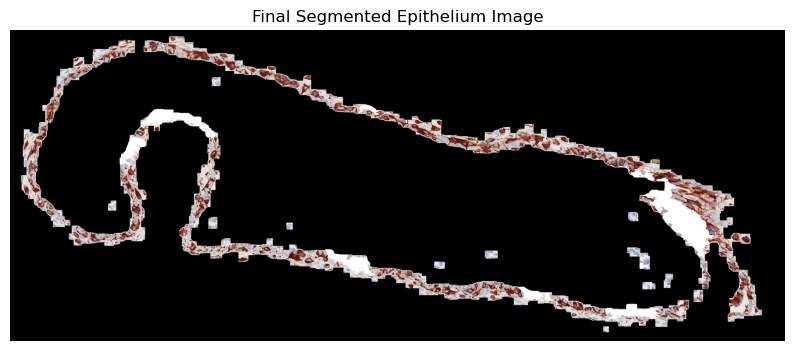

In [140]:
extract_epithelium('Tissue Slices/Melan-A/h1812404A melan a_ROI_1.tif')

## Testing on Sox-10

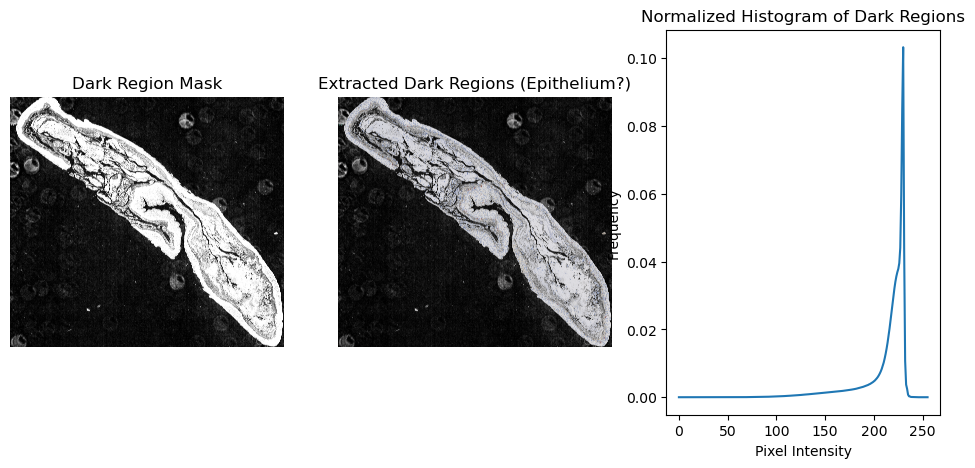

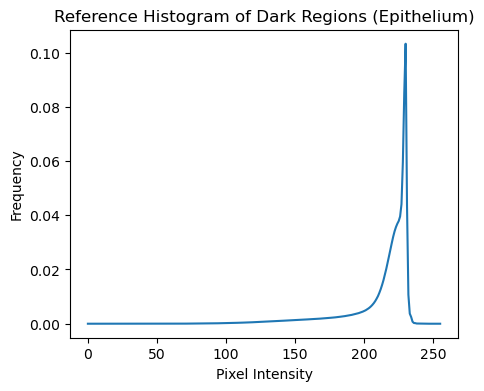

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


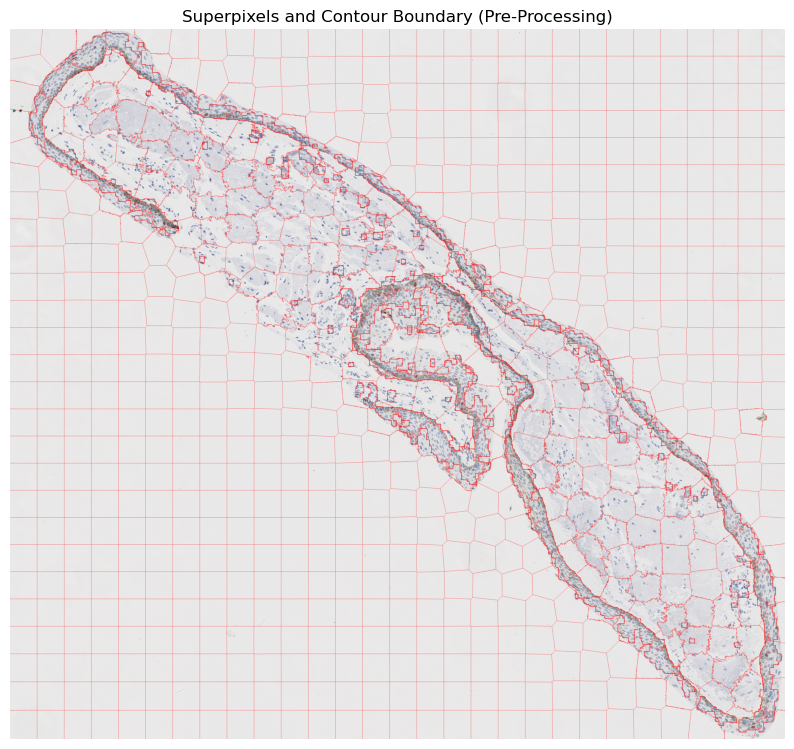

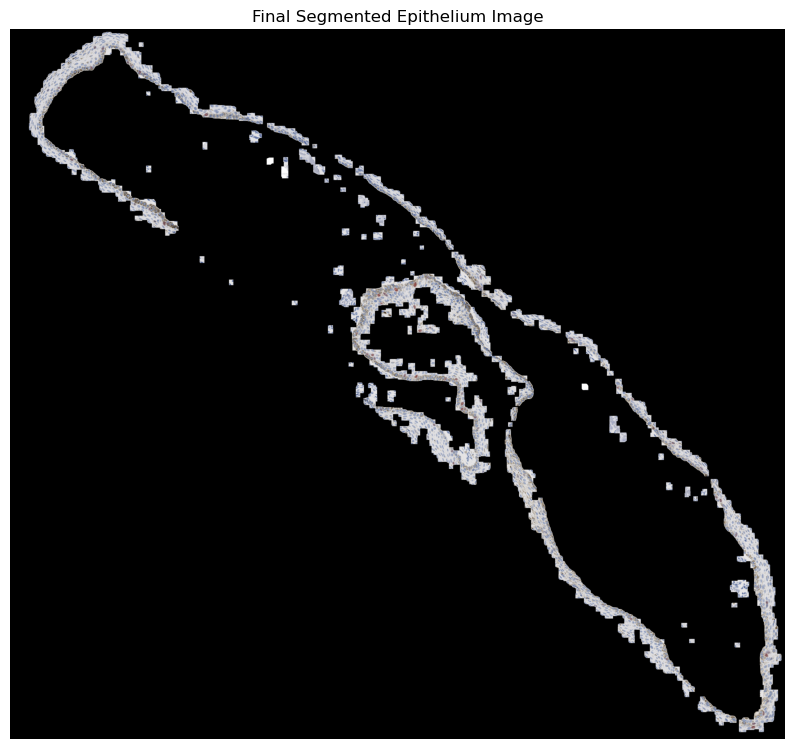

In [139]:
extract_epithelium('Tissue Slices/Sox-10/h1810898A sox10_ROI_1.tif')